<div style="padding:30px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:center;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">⚙️ Hyperparameter Optimization for Logistic Regression Algorithms ⚙️</div>

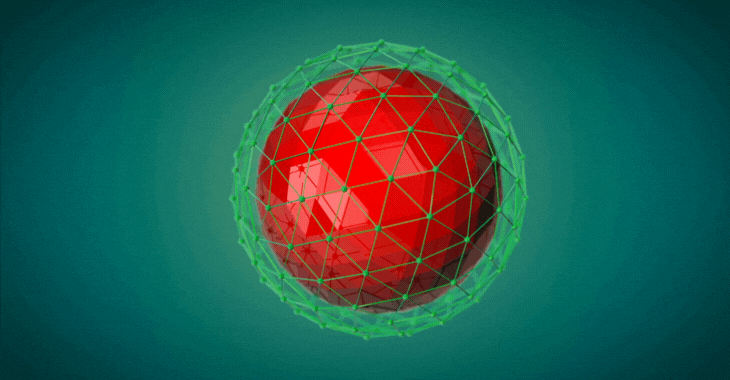

<a id=''></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700"><span style='color:#CDA63A'>|</span> Table of Contents</div>

<a id="toc"></a>
- **[1. Introduction](#1)**
    - **[1.1 Logistic Regression](#1.1)**
    - **[1.2 Parameters vs. Hyperparameters](#1.2)**
    - **[1.3 Hyperparameter Tuning](#1.3)**
- **[2. Set-up](#2)**
    - **[2.1 Import Libraries](#2.1)**
    - **[2.2 Discover Data](#2.2)**
    - **[2.3 Preprocessing](#2.3)**
    - **[2.4 Data Cleaning](#2.4)**
- **[3. Logistic Regression Hyperparameters](#3)**
    - **[3.1 Finding the best 'solver' and 'penalty'](#3.1)**
        - **[3.1.1 Solver](#3.1.1)**
        - **[3.1.2 Penalty (Regularization)](#3.1.2)**
    - **[3.2 max_iter](#3.2)**
    - **[3.3 C](#3.3)**
    - **[3.4 tol](#3.4)**
    - **[3.5 fit_intercept](#3.5)**
    - **[3.6 intercept_scaling](#3.6)**
    - **[3.7 class_weight](#3.7)**
    - **[3.8 random_state](#3.8)**
    - **[3.9 multi_class](#3.9)**
    - **[3.10 verbose](#3.10)**
    - **[3.11 warm_start](#3.11)**
    - **[3.12 l1_ratio](#3.12)**
- **[4. Model Building](#4)**
    - **[4.1 Model 1 | Default hyperparameters](#4.1)**
    - **[4.2 Model 2 | Best hyperparameters for “liblinear”](#4.2)**
    - **[4.3 Model 3 | Best hyperparameters for “lbfgs”](#4.3)**
    - **[4.4 Model 4 | Best hyperparameters for “newton-cg”](#4.4)**
- **[5. Conclusion](#5)**
- **[References](#6)**

<a id="1"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">1 <span style='color:#CDA63A'>|</span> Introduction</div>

**In this notebook**, we will follow a systematic approach to fine-tune the logistic regression algorithm’s hyperparameters. Our process will consist of the following steps:

1. **Manually adjusting each hyperparameter**
2. **Evaluating the impact of each hyperparameter on the model’s accuracy**
3. **Identifying optimal values for the hyperparameters**

Once we have determined the best hyperparameters, we will compare the performance of various models using these optimal values. Finally, we will provide a comprehensive analysis of the effectiveness of hyperparameter tuning in enhancing the model’s performance.

Before diving into our primary objective, it’s crucial to address some fundamental concepts related to this subject.

<a id="1.1"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">1.1 <span style='color:#CDA63A'>|</span> Logistic Regression
</div>

**Logistic Regression** is a supervised machine learning algorithm and is a linear model for binary classification. In this model, the probabilities that describe the possible outcomes of an experiment are modeled using a logistic function [[Reference]](https://www.geeksforgeeks.org/understanding-logistic-regression/).

The **logistic function** is defined as:

$$f(x) = \frac{L}{1 + e^{-k(x-x_0)}}$$

where:

· **x:** the midpoint values of the sigmoid curve

· **L:** the maximum value of the curve

· **k:** the logistic growth rate or the slope of the curve

Here, **x** represents the input features, and the output is a binary variable (**0 or 1**). The logistic regression algorithm learns the optimal values of the coefficients from the training data to predict the probability of the binary outcome for new input data. Once the model is trained, it can be used to predict the binary outcome by thresholding the predicted probability [[Reference]](https://www.geeksforgeeks.org/understanding-logistic-regression/).

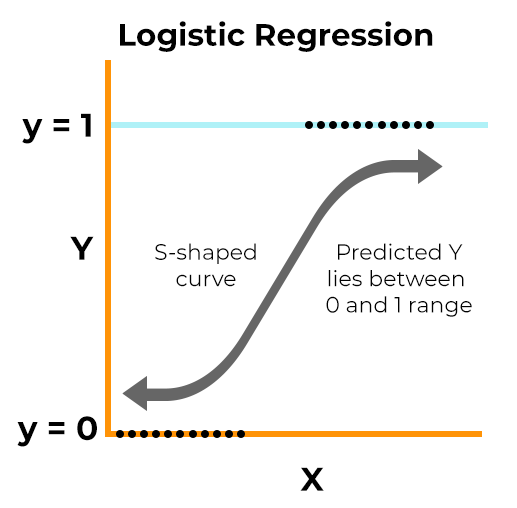

<a id="1.2"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">1.2 <span style='color:#CDA63A'>|</span> Parameters vs. Hyperparameters
</div>

Model **parameters** and **hyperparameters** are the two parameter types used in Machine Learning (ML) models. Data estimation or data learning can be used to adjust the model’s parameters. **Parameters** are values that the model learns from the data, while hyperparameters are values that the user sets to control the behavior of the learning algorithm. **Hyperparameters** affect how the parameters are learned, and choosing good hyperparameters can be crucial for achieving good performance on a given task. However, the process of optimizing hyperparameters can be complex and time-consuming, especially when dealing with many hyperparameters or multiple optimization objectives. Therefore, it’s important to strike a balance between optimizing hyperparameters and avoiding overfitting the training data [[Reference]](https://www.blog.trainindata.com/hyperparameter-tuning-for-machine-learning/).

<a id="1.3"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">1.3 <span style='color:#CDA63A'>|</span> Hyperparameter Tuning
</div>

**Hyperparameter tuning** is a critical part of the machine learning process as it can significantly affect the performance of the model. By selecting the right hyperparameters, such as learning rate and regularization, among others, a model can achieve optimal performance. However, the process of hyperparameter tuning can be challenging and time-consuming, as there are many hyperparameters to consider, and the search space can be vast. Therefore, it is essential to strike a balance between optimizing the model’s performance and avoiding an endless cycle of trying to optimize [[Reference]](https://www.blog.trainindata.com/hyperparameter-tuning-for-machine-learning/).

<a id="2"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">2. <span style='color:#CDA63A'>|</span> Set-up</div>

To accomplish our main task, i have chosen the **diabetes dataset** [[Dataset]](https://www.kaggle.com/datasets/mathchi/diabetes-data-set).

The **goal** of this classification problem is to develop a model that can accurately classify patients as either **diabetic** or **non-diabetic** based on their medical information. This is a **binary classification** problem. This type of classification problem is important in healthcare as it can assist in the early diagnosis and treatment of diabetes, which is a chronic disease that affects millions of people worldwide.

<a id="2.1"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">2.1. <span style='color:#CDA63A'>|</span> Import Libraries</div>

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, auc, accuracy_score, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, PrecisionRecallDisplay, RocCurveDisplay

In [2]:
# Supress warnings
import warnings
warnings.filterwarnings('ignore')

<a id="2.2"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">2.2. <span style='color:#CDA63A'>|</span> Discover Data</div>

In [7]:
# Preview the dataset
df = pd.read_csv('E:\diabetes.csv')
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [11]:
# View dimensions of dataset   
rows, col = df.shape
print ("Dimensions of dataset: {}" . format (df.shape))
print ('Rows:', rows, '\nColumns:', col)

Dimensions of dataset: (768, 9)
Rows: 768 
Columns: 9


In [12]:
# Columns
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [13]:
# Information about the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


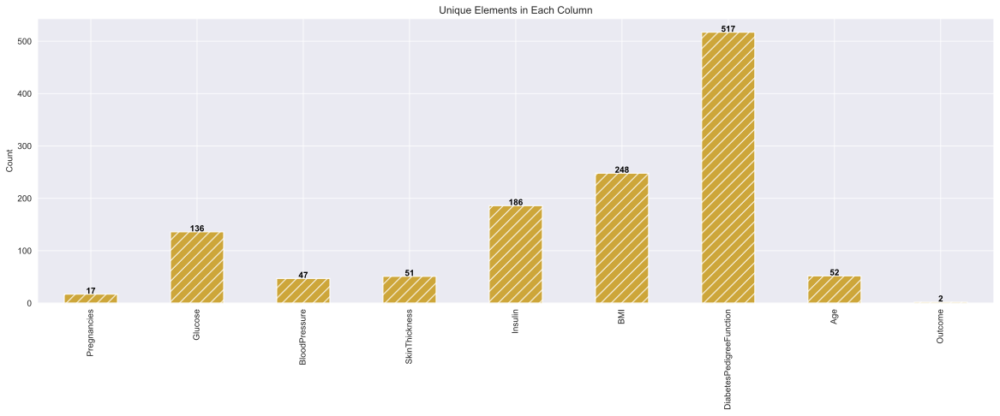

In [14]:
# Plot the unique values
unique = df.nunique()
sns.set_style('darkgrid')
plt.figure(figsize=(20, 6))
unique.plot(color='#CDA63A', kind='bar', hatch='//')
plt.title('Unique Elements in Each Column')
plt.ylabel('Count')
for i, v in enumerate(unique.values):
    plt.text(i, v+1, str(v), color='black', fontweight='bold', ha='center')
plt.show()

<a id="2.3"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">2.3. <span style='color:#CDA63A'>|</span> Preprocessing</div>

In [8]:
# Statistical details
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


<div style="background-color:#CDA63A; padding:20px; font-size:15px">    

🔍We noticed that some columns have a minimum value of **0**, which is medically impossible. Therefore, during the data cleaning process, we need to replace these values with the median or mean value, depending on the distribution. Additionally, we observed insulin levels as high as **846** in the max column, indicating the presence of outliers that need to be treated.

<a id="2.4"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">2.4. <span style='color:#CDA63A'>|</span> Data Cleaning</div>

<div style=" background-color:#db6797;
            text-align:left;
            padding: 13px 13px; 
            border-radius: 8px; 
            margin: auto;
            color: black">

In certain cases, it is medically implausible for certain data records to exhibit a value of 0, such as in blood pressure or glucose levels. Consequently, it is advisable to replace these 0 values with the **mean** value of the respective column.
    
🔍[Read More](https://towardsdatascience.com/the-ultimate-guide-to-data-cleaning-3969843991d4)

In [9]:
# Count zero values
columns = ['Insulin', 'Glucose', 'BloodPressure', 'SkinThickness', 'BMI']

counts = []
for column in columns:
    count = df[df[column] == 0].shape[0]
    counts.append({"Feature": column, "Count": count})

pd.DataFrame(counts)

,Feature,Count
0,Insulin,374
1,Glucose,5
2,BloodPressure,35
3,SkinThickness,227
4,BMI,11


⚠️

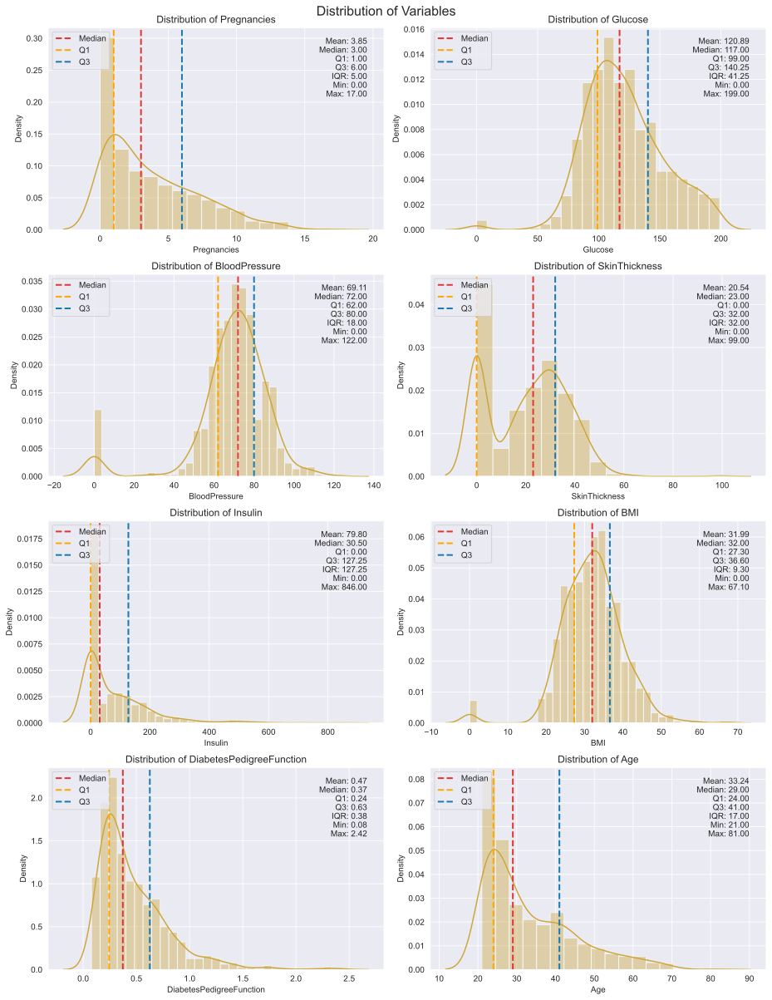

In [15]:
# Check variables distribution
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(13, 17))

# Define colors to use for each feature
colors = ["#CDA63A"]

col = df.drop('Outcome', axis=1)

# Loop through each column and plot distribution
for i, column in enumerate(col):
    # Plot histogram with density curve
    sns.distplot(df[column], color=colors[i%1], ax=axes[i//2, i%2])
    
    # Add vertical lines for mean, median, Q1 and Q3
    axes[i//2, i%2].axvline(x=df[column].median(), color='#e33434', linestyle='--', linewidth=2, label='Median')
    axes[i//2, i%2].axvline(x=df[column].quantile(0.25), color='orange', linestyle='--', linewidth=2, label='Q1')
    axes[i//2, i%2].axvline(x=df[column].quantile(0.75), color='#177ab0', linestyle='--', linewidth=2, label='Q3')
    
    # Add text box with important statistics
    median = df[column].median()
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    axes[i//2, i%2].text(0.95, 0.95, 
                          'Mean: {:.2f}\nMedian: {:.2f}\nQ1: {:.2f}\nQ3: {:.2f}\nIQR: {:.2f}\nMin: {:.2f}\nMax: {:.2f}'.format(
                              df[column].mean(), median, q1, q3, iqr, df[column].min(), df[column].max()),
                          transform=axes[i//2, i%2].transAxes,
                          fontsize=10, va='top', ha='right')
    
    # Add legend
    axes[i//2, i%2].legend(loc = "upper left")
    
    # Set title of subplot
    axes[i//2, i%2].set_title('Distribution of '+ column)
    
# Add overall title and adjust spacing
fig.suptitle('Distribution of Variables', fontsize=16)
fig.tight_layout()

<div style="background-color:#CDA63A; padding:20px; font-size:15px">    

📝We can observe that only **Glucose**, **Blood Pressure**, and **BMI** follow a normal distribution, while the remaining variables exhibit skewed distributions.

In [11]:
# Check variables skewness

# create an empty DataFrame to store the results
skew_df = pd.DataFrame(columns=['Feature', 'Skewness_type'])

# loop over each feature and calculate its skewness
for columns in columns:
    skew = df[columns].skew()
    
    # determine whether the skewness is positive or negative
    if skew > 0:
        skewness = 'Positively skewed'
    elif skew < 0:
        skewness = 'Negatively skewed'
    else:
        skewness = 'Symmetric'
    
    # add the results to the DataFrame
    skew_df = skew_df.append({'Feature': columns, 'Skewness_type': skewness, 'Skewness_value': skew}, ignore_index=True)

skew_df

,Feature,Skewness_type,Skewness_value
0,Insulin,Positively skewed,2.272251
1,Glucose,Positively skewed,0.173754
2,BloodPressure,Negatively skewed,-1.843608
3,SkinThickness,Positively skewed,0.109372
4,BMI,Negatively skewed,-0.428982


⚠️

<div style=" background-color:#db6797;
            text-align:left;
            padding: 13px 13px; 
            border-radius: 8px; 
            margin: auto;
            color: black">

When dealing with missing or zero values in a dataset, it's important to choose the appropriate method for replacing them based on the distribution of the data.

**Glucose, Blood Pressure and BMI:** Since these variables have normal (Gaussian) distributions, using the mean value to replace zero values is appropriate. The **mean** is a good measure of central tendency for normally distributed data.

**SkinThickness, Insulin:** These variables have skewed distributions, which means that outliers can significantly affect the mean. In such cases, it's better to use the **median**, which is less sensitive to extreme values.
    
🔍[Read More](https://towardsdatascience.com/the-ultimate-guide-to-data-cleaning-3969843991d4)

In [12]:
def replace_zero_with_mean(column):
    return column.replace(0, column.mean())

columns_to_update = ['Glucose', 'BloodPressure', 'BMI']

for col in columns_to_update:
    df[col] = replace_zero_with_mean(df[col])

In [13]:
def replace_zero_with_median(column):
    return column.replace(0, column.median())

columns_to_update = ['SkinThickness', 'Insulin']

for col in columns_to_update:
    df[col] = replace_zero_with_median(df[col])

In [14]:
# Count zero values again
columns = ['Insulin', 'Glucose', 'BloodPressure', 'SkinThickness', 'BMI']

counts = []
for column in columns:
    count = df[df[column] == 0].shape[0]
    counts.append({"Feature": column, "Count": count})

pd.DataFrame(counts)

,Feature,Count
0,Insulin,0
1,Glucose,0
2,BloodPressure,0
3,SkinThickness,0
4,BMI,0


In [15]:
# Check variables skewness

# create an empty DataFrame to store the results
skew_df = pd.DataFrame(columns=['Feature', 'Skewness_type'])

# loop over each feature and calculate its skewness
for columns in columns:
    skew = df[columns].skew()
    
    # determine whether the skewness is positive or negative
    if skew > 0:
        skewness = 'Positively skewed'
    elif skew < 0:
        skewness = 'Negatively skewed'
    else:
        skewness = 'Symmetric'
    
    # add the results to the DataFrame
    skew_df = skew_df.append({'Feature': columns, 'Skewness_type': skewness, 'Skewness_value': skew}, ignore_index=True)

skew_df

,Feature,Skewness_type,Skewness_value
0,Insulin,Positively skewed,2.693181
1,Glucose,Positively skewed,0.533225
2,BloodPressure,Positively skewed,0.173050
3,SkinThickness,Positively skewed,1.223057
4,BMI,Positively skewed,0.601103


✅

In [16]:
# Missing values
missing_values = pd.DataFrame(df.isnull().sum(), columns=['Missing Values'])
missing_values

,Missing Values
Pregnancies,0
Glucose,0
BloodPressure,0
SkinThickness,0
Insulin,0
BMI,0
DiabetesPedigreeFunction,0
Age,0
Outcome,0


✅

In [17]:
# Duplicated data
df.duplicated().sum()

0

✅

In [18]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.681605,72.254807,27.334635,94.652344,32.450805,0.471876,33.240885,0.348958
std,3.369578,30.436016,12.115932,9.229014,105.547598,6.875374,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.750000,64.000000,23.000000,30.500000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,31.250000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


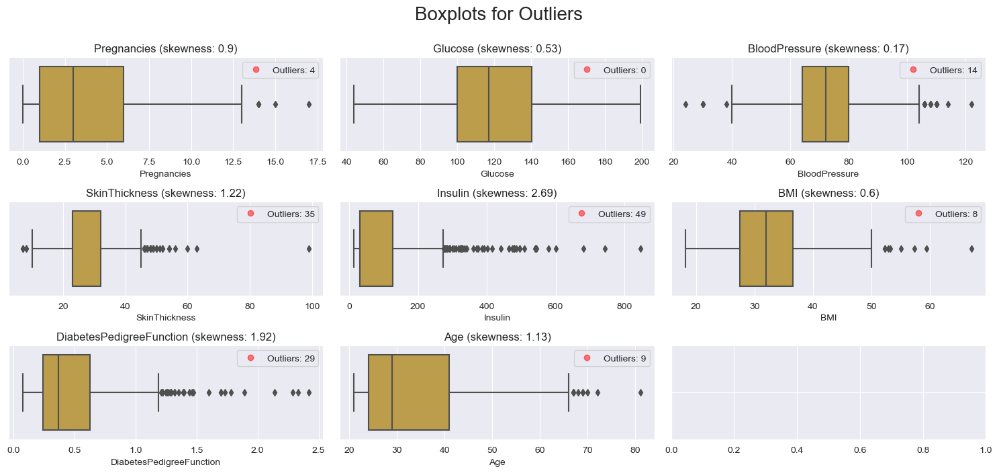

In [19]:
# Outliers

# Separate numerical features
num_cols = pd.DataFrame (df, columns= ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness',
                                       'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age'])

def plot_numerical_features_boxplots(data, columns_list, rows, cols, title):
    sns.set_style('darkgrid')
    fig, axs = plt.subplots(rows, cols, figsize=(15, 7), sharey=True)
    fig.suptitle(title, fontsize=20, y=1)
    axs = axs.flatten()
    outliers_df = pd.DataFrame(columns=['Column', 'Outlier_index', 'Outlier_values'])
    for i, col in enumerate(columns_list):
        sns.boxplot(x=data[col], color='#CDA63A', ax=axs[i])
        axs[i].set_title(f'{col} (skewness: {data[col].skew().round(2)})', fontsize=12)
        #----------------------------
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        outliers = ((data[col] < (Q1 - 1.5 * IQR)) | (data[col] > (Q3 + 1.5 * IQR)))
        outliers_index = data[outliers].index.tolist()
        outliers_values = data[col][outliers].tolist()
        outliers_df = outliers_df.append({'Column': col, 'Outlier_index': outliers_index, 'Outlier_values': outliers_values}, ignore_index=True)
        axs[i].plot([], [], 'ro', alpha=0.5, label=f'Outliers: {outliers.sum()}')
        axs[i].legend(loc='upper right', fontsize=10)
    plt.tight_layout()
    return outliers_df

outliers_df = plot_numerical_features_boxplots(data=df, columns_list=num_cols, rows=3, cols=3, title='Boxplots for Outliers')

In [20]:
outliers_df

,Column,Outlier_index,Outlier_values
0,Pregnancies,"[88, 159, 298, 455]","[15, 17, 14, 14]"
1,Glucose,[],[]
2,BloodPressure,"[18, 43, 84, 106, 125, 177, 362, 549, 597, 599...","[30.0, 110.0, 108.0, 122.0, 30.0, 110.0, 108.0..."
3,SkinThickness,"[16, 39, 57, 86, 99, 120, 150, 177, 211, 254, ...","[47, 47, 60, 54, 51, 56, 50, 46, 54, 7, 50, 52..."
4,Insulin,"[8, 13, 53, 54, 56, 111, 139, 144, 153, 162, 1...","[543.0, 846.0, 300.0, 342.0, 304.0, 495.0, 325..."
5,BMI,"[120, 125, 177, 193, 247, 303, 445, 673]","[53.2, 55.0, 67.1, 52.3, 52.3, 52.9, 59.4, 57.3]"
6,DiabetesPedigreeFunction,"[4, 12, 39, 45, 58, 100, 147, 187, 218, 228, 2...","[2.288, 1.441, 1.39, 1.893, 1.781, 1.222, 1.4,..."
7,Age,"[123, 363, 453, 459, 489, 537, 666, 674, 684]","[69, 67, 72, 81, 67, 67, 70, 68, 69]"


⚠️

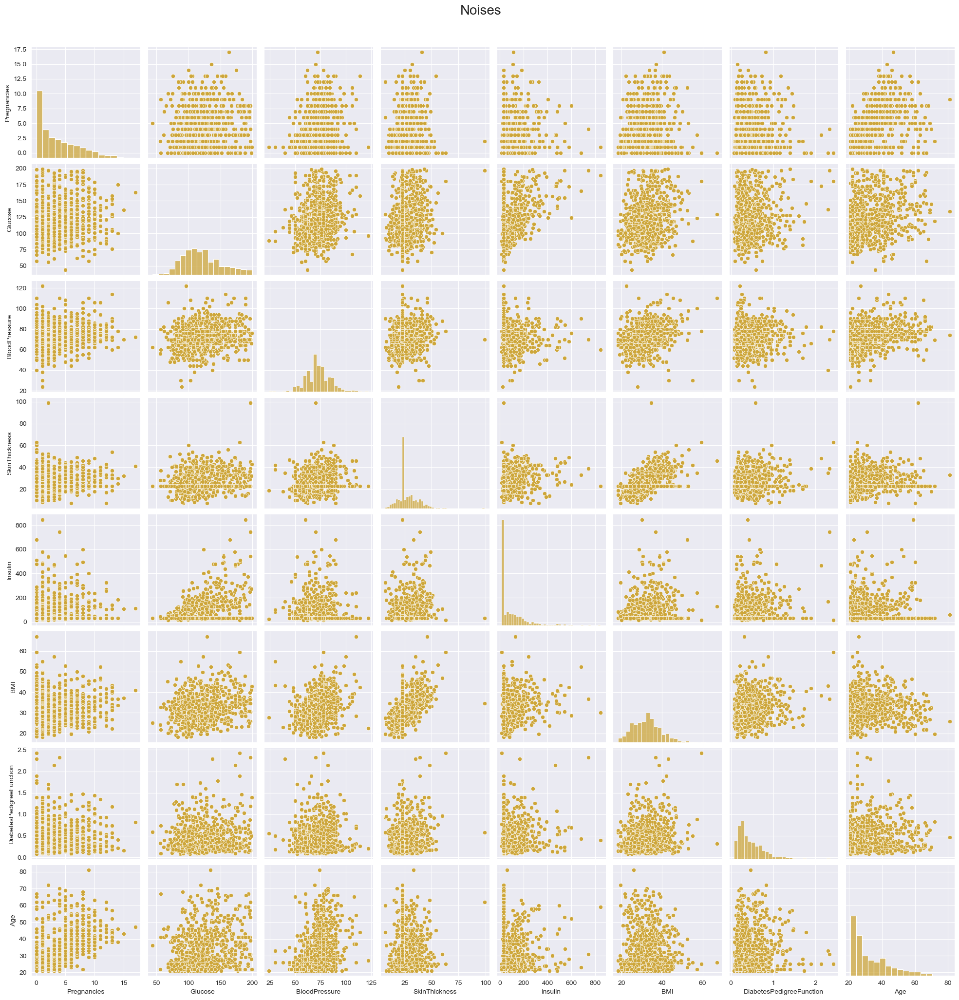

In [21]:
# Noises
colors = ['#CDA63A']

num_variables = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness',
                 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']

sns.set_style('darkgrid')
sns.set_palette(colors)
sns.pairplot(df[num_variables])
plt.suptitle('Noises', y=1.03, fontsize=20)
plt.show()

⚠️

<div style=" background-color:#db6797;
            text-align:left;
            padding: 13px 13px; 
            border-radius: 8px; 
            margin: auto;
            color: black">

**Outliers Treatment** refers to the process of dealing with extreme values or outliers that may be present in a dataset. This process helps to prevent the outliers from affecting the statistical analysis and machine learning models.

- **Flooring and Capping** involves replacing values below a certain threshold (floor) and above a certain threshold (cap) with the corresponding threshold values.

- **Trimming** involves removing the extreme values completely from the dataset.

- **Replacing** outliers with the **mean, median, mode, or other values** involves replacing the extreme values with a central tendency measure such as the mean, median or mode. However, this method should be used with caution as it can distort the distribution and may not accurately represent the true data.

- In order to **handle** these extreme values without losing the data and prevent them from having a disproportionate effect on the analysis, I will use the **Flooring and Capping** technique. 
    
**🔸Flooring And Capping:**
    
In this quantile-based technique, we will do the flooring (e.g 25th percentile) for the lower values and capping (e.g for the 75th percentile) for the higher values. These percentile values will be used for the quantile-based flooring and capping.
    
🔍[Read more (1)](https://medium.com/analytics-vidhya/identifying-cleaning-and-replacing-outliers-titanic-dataset-20182a062893#:~:text=in%20this%20technique%2C%20we%20replace,is%20highly%20susceptible%20to%20outliers.)
🔍[Read more (2)](https://www.analyticsvidhya.com/blog/2021/05/detecting-and-treating-outliers-treating-the-odd-one-out/#:~:text=As%20the%20mean%20value%20is,outliers%20with%20the%20median%20value.)

In [22]:
# Calculate the IQR for each column in the dataset
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Calculate upper and lower whisker values for each column
whisker_width = 1.5
lower_whisker = Q1 - (whisker_width * IQR)
upper_whisker = Q3 + (whisker_width * IQR)

# Replace outliers with upper or lower whisker values for each column
for col in df.columns:
    df[col] = np.where(df[col] > upper_whisker[col], upper_whisker[col], np.where(df[col] < lower_whisker[col], lower_whisker[col], df[col]))

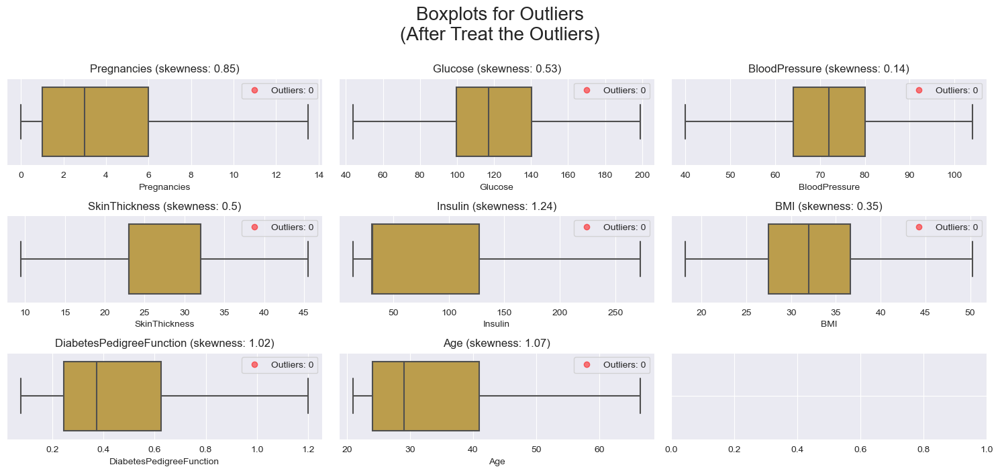

In [23]:
# Outliers (After Treat the Outliers)

def plot_numerical_features_boxplots(data, columns_list, rows, cols, title):
    sns.set_style('darkgrid')
    fig, axs = plt.subplots(rows, cols, figsize=(15, 7), sharey=True)
    fig.suptitle(title, fontsize=20, y=1)
    axs = axs.flatten()
    outliers_df = pd.DataFrame(columns=['Column', 'Outlier_index', 'Outlier_values'])
    for i, col in enumerate(columns_list):
        sns.boxplot(x=data[col], color='#CDA63A', ax=axs[i])
        axs[i].set_title(f'{col} (skewness: {data[col].skew().round(2)})', fontsize=12)
        #----------------------------
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        outliers = ((data[col] < (Q1 - 1.5 * IQR)) | (data[col] > (Q3 + 1.5 * IQR)))
        outliers_index = data[outliers].index.tolist()
        outliers_values = data[col][outliers].tolist()
        outliers_df = outliers_df.append({'Column': col, 'Outlier_index': outliers_index, 'Outlier_values': outliers_values}, ignore_index=True)
        axs[i].plot([], [], 'ro', alpha=0.5, label=f'Outliers: {outliers.sum()}')
        axs[i].legend(loc='upper right', fontsize=10)
    plt.tight_layout()
    return outliers_df

outliers_df = plot_numerical_features_boxplots(data=df, columns_list=num_cols, rows=3, cols=3, title='Boxplots for Outliers\n(After Treat the Outliers)')

✅

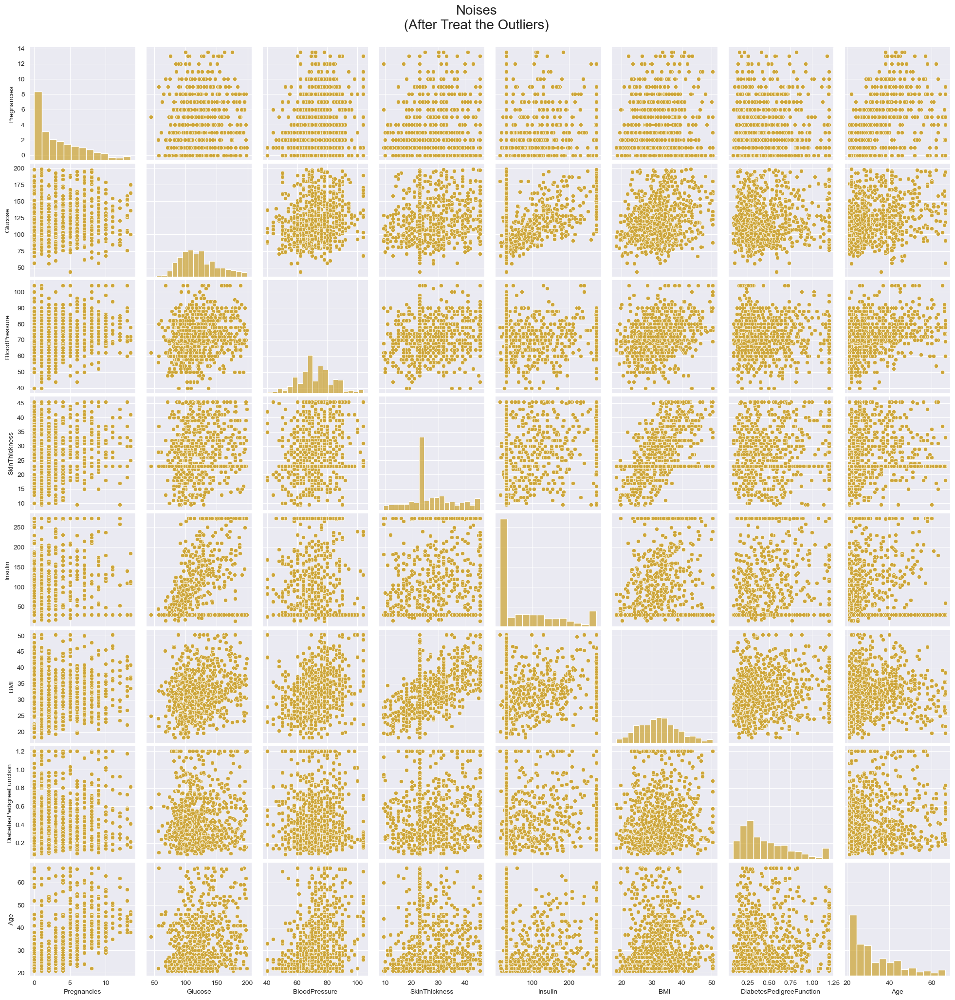

In [24]:
# Noises
colors = ['#CDA63A']
sns.set_style('darkgrid')
sns.set_palette(colors)
sns.pairplot(df[num_variables])
plt.suptitle('Noises\n(After Treat the Outliers)', y=1.03, fontsize=20)
plt.show()

✅

In [25]:
# Theme
import matplotlib.colors
colors = ['#CDA63A', '#47baab', '#db6797', '#3b3745']
cmap = matplotlib.colors.ListedColormap(colors)

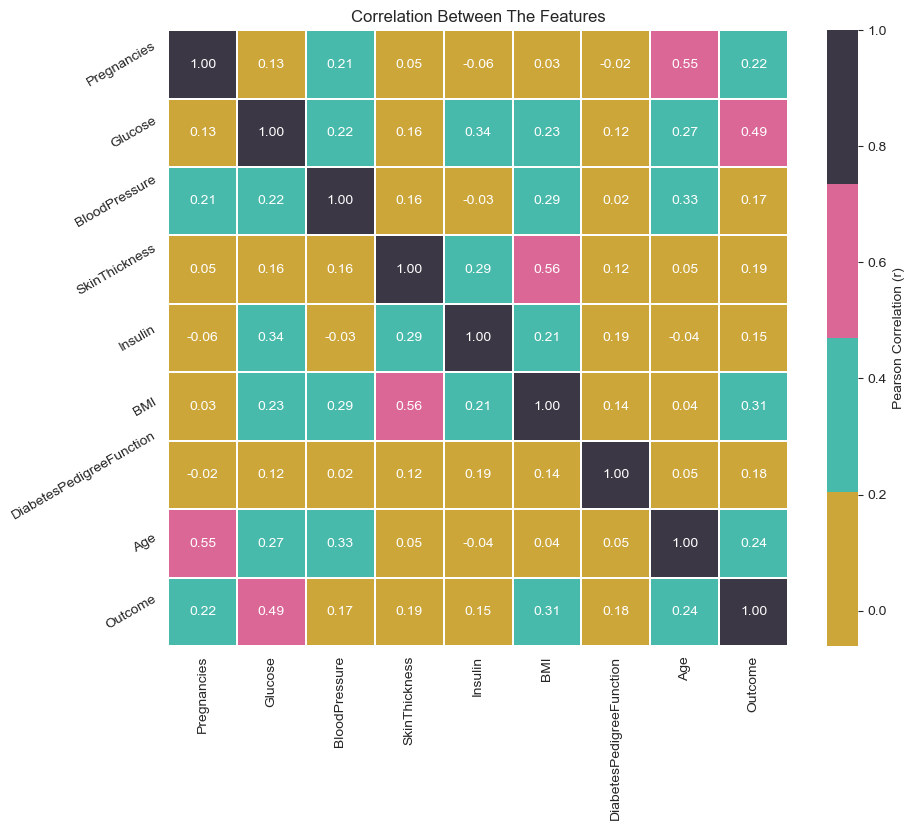

In [26]:
# Correlation
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Correlation Between The Features')
a = sns.heatmap(df.corr(), annot=True, cbar_kws={'label':'Pearson Correlation (r)'}, cmap=cmap, fmt='.2f', linewidths=0.2)
a.set_xticklabels(a.get_xticklabels(), rotation=90)
a.set_yticklabels(a.get_yticklabels(), rotation=30)
plt.show()

<div style="background-color:#CDA63A; padding:20px; font-size:15px">    

📝The **Outcome** row in the correlation matrix provides insight into the relationship between different features and the target variable. By analyzing these correlation scores, we can identify that **Glucose**, **BMI**, **Age**, and **Pregnancies** have the strongest correlation with the **Outcome** variable.

In [27]:
print('Final Dataset After Cleaning:')
df.describe()

Final Dataset After Cleaning:


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.837240,121.681605,72.226161,27.116536,86.139811,32.388956,0.458914,33.199870,0.348958
std,3.344157,30.436016,11.716722,8.447423,76.287377,6.667633,0.285596,11.628404,0.476951
min,0.000000,44.000000,40.000000,9.500000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.750000,64.000000,23.000000,30.500000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,31.250000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,13.500000,199.000000,104.000000,45.500000,272.375000,50.250000,1.200000,66.500000,1.000000


In [78]:
print('The Shape of the Final Dataset:')
rows, col = df.shape
print ("Dimensions of dataset: {}" . format (df.shape))
print ('Rows:', rows, '\nColumns:', col)

The Shape of the Final Dataset:
Dimensions of dataset: (768, 9)
Rows: 768 
Columns: 9


✅

<a id="3"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3 <span style='color:#CDA63A'>|</span> Logistic Regression Hyperparameters</div>

The main hyperparameters i will tune in logistic regression are **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">solver, penalty, max_iter, C (regularization strength), tol, fit_intercept, intercept_scaling, class_weight, random_state, multi_class, verbose, warm_start, and l1_ratio</mark>** [[sklearn documentation]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

<a id="3.1"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.1 <span style='color:#CDA63A'>|</span> 🥇Finding the best 'solver' and 'penalty'</div>

<a id="3.1.1"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.1.1 <span style='color:#CDA63A'>|</span> Solver</div>

**<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">Solver</mark>** is the algorithm to use in the optimization problem. The choices are **{‘newton-cg’, ‘lbfgs’, ‘liblinear’, ‘sag’, ‘saga’}**, **default=’lbfgs’**.

· **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">“lbfgs”</mark>** relatively performs well compared to other methods and it saves a lot of memory, however, sometimes it may have issues with convergence.

· **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">“sag”</mark>** faster than other solvers for large datasets, when both the number of samples and the number of features are large.

· **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">“saga”</mark>** is the solver of choice for sparse multinomial logistic regression and it’s also suitable for very large datasets.

· **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">“newton-cg”</mark>** is computationally expensive because of the Hessian Matrix.

· **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">“liblinear”</mark>** is recommended when you have a high-dimension dataset — solving large-scale classification problems [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

Please note that **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">“sag”</mark>** and **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">“saga”</mark>** may only converge quickly when the features have a similar scale. 

To ensure this, we recommend scaling the data using either **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">StandardScaler</mark>** or **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">MinMaxScaler</mark>** from the sklearn.preprocessing module before fitting.

<a id="3.1.2"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.1.2 <span style='color:#CDA63A'>|</span> Penalty (Regularization)</div>

**<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">Penalty (or regularization)</mark>** intends to reduce model generalization error and is meant to disincentivize and regulate overfitting. The technique discourages learning a more complex model, so as to avoid the risk of overfitting. The choices are **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">{‘l1’, ‘l2’, ‘elasticnet’, ‘none’}, default=’l2’</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html). However, some penalties may not work with some solvers, the following table summarizes the penalties supported by each solver:

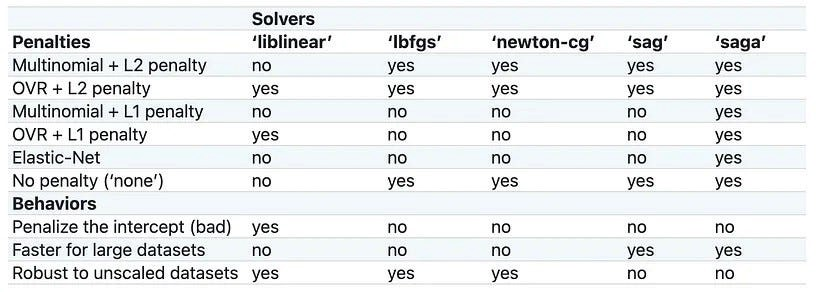

Before tuning the hyperparameters, we create a **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">baseline model</mark>** by fitting the classifier with default parameters.

In [29]:
#Declare Feature Vector and Target Variable
X = df.drop('Outcome', axis=1)
y = df[['Outcome']]
y = y.values.ravel()

In [30]:
# Check the shape of X and y
print ('X:', X.shape,'\ny:', y.shape)

X: (768, 8) 
y: (768,)


In [31]:
# Train Test Split (test_size=0.25)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

In [32]:
# Create a MinMaxScaler instance and fit it to the training data
scaler = MinMaxScaler() # saga solver requires features to be scaled for model conversion
X_train = scaler.fit_transform(X_train)

# Transform the test data using the same scaler
X_test = scaler.transform(X_test)

In [33]:
# Create a LogisticRegression instance and fit it to the scaled training data
logreg = LogisticRegression() # (default penalty = "l2") / (default solver = "lbfgs")
logreg.fit(X_train, y_train)

# Predict using the scaled test data
y_pred = logreg.predict(X_test)

print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))
print('Precision of logistic regression classifier on test set: {:.2f}'.format(precision_score(y_test, y_pred)))

Accuracy of logistic regression classifier on train set: 0.77
Accuracy of logistic regression classifier on test set: 0.79
Precision of logistic regression classifier on test set: 0.74


We will use **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">accuracy, precision, and recall</mark>** as baseline metrics to compare any progress made during the optimization work. We will also examine the impact of each hyperparameter on model accuracy. In the primary model, default values were used for the solver and penalty hyperparameters.

Interestingly, the accuracy of the test data exceeded that of the train data. Moreover, we observed a precision of 0.74.

Since the choice of solver depends on the chosen penalty, we aim to select the most suitable solver based on the **penalties supported by each solver** in order to enhance the metrics in comparison to the initial model.

| **solver** | **Supporting penalties** |
|     :---      |       :---      |      
| **lbfgs** | ‘l2’, ‘None’ |                
| **liblinear** | ‘l1’, ‘l2’ |                        
| **newton-cg** | ‘l2’, ‘None’ |
| **sag** | ‘l2’, ‘None’ |
| **saga** | ‘elasticnet’, ‘l1’, ‘l2’, ‘None’ |

At first, we start with the default value of the solver i.e. “lbfgs” and penalty = “None”:

In [34]:
# default solver = 'lbfgs'
logreg = LogisticRegression(penalty='none')
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))
print('Precision of logistic regression classifier on test set: {:.2f}'.format(precision_score(y_test, y_pred)))

Accuracy of logistic regression classifier on train set: 0.77
Accuracy of logistic regression classifier on test set: 0.80
Precision of logistic regression classifier on test set: 0.73


It can be seen that the metrics of the model improved compared to the initial model.

Then we calculate the metrics for the rest of the solvers with **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">penalty = “None”</mark>**:

In [35]:
# penalty = “None”
clf = [
    LogisticRegression(solver='newton-cg',penalty='none'),
    LogisticRegression(solver='sag',penalty='none'),
    LogisticRegression(solver='saga',penalty='none')
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precision'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precision,Recall,AUC
0,0.76562,0.79688,0.73469,0.58065,0.74032
1,0.76562,0.79688,0.73469,0.58065,0.74032
2,0.76562,0.79688,0.73469,0.58065,0.74032


Similarly, it can be seen that the metrics of the model improved compared to the initial model and obtained the same metrics as the previous setting (**<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">“lbfgs”</mark>** and **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">penalty = “None”</mark>**).

Now, we calculate metrics for solvers with **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">penalty = ‘l2’</mark>**:

In [36]:
# penalty = 'l2'
clf = [
    LogisticRegression(solver='newton-cg',penalty='l2'),
    LogisticRegression(solver='sag',penalty='l2'),
    LogisticRegression(solver='saga',penalty='l2'),
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precision '] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precision,Recall,AUC
0,0.76736,0.78646,0.74419,0.51613,0.71576
1,0.76736,0.78646,0.74419,0.51613,0.71576
2,0.76736,0.78646,0.74419,0.51613,0.71576


It can be seen that these values of metrics are the same as the values of the base model.

By setting **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">solver = “liblinear”</mark>** with **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">penalty = “l1/l2”</mark>**, we calculate the metrics of the model:

In [37]:
# solver = “liblinear” with penalty = “l1”
logreg = LogisticRegression(solver='liblinear', penalty='l1')
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))
print('Precision of logistic regression classifier on test set: {:.2f}'.format(precision_score(y_test, y_pred)))

Accuracy of logistic regression classifier on train set: 0.77
Accuracy of logistic regression classifier on test set: 0.79
Precision of logistic regression classifier on test set: 0.73


In [38]:
# solver = “liblinear” with penalty = “l2”
logreg = LogisticRegression(solver='liblinear', penalty='l2')
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))
print('Precision of logistic regression classifier on test set: {:.2f}'.format(precision_score(y_test, y_pred)))

Accuracy of logistic regression classifier on train set: 0.76
Accuracy of logistic regression classifier on test set: 0.78
Precision of logistic regression classifier on test set: 0.72


It is evident that the training and testing accuracies for the **L1 penalty** are superior to those for the **L2 penalty**.

The **optimal penalties** for enhancing model accuracy for various solvers, based on the investigations conducted on the diabetes dataset, are displayed in the table below:

| **solver** | **best penalty** |
|    :---    |       :---       |      
| **lbfgs** | 🥇‘None’ |                
| **newton-cg** | 🥇‘None’ |                        
| **sag** | 🥇‘None’ |
| **saga** | 🥇‘None’ |
| **liblinear** | 🥇‘l1’ |

In the following, we assess the impact of various hyperparameters on the model’s accuracy to determine if they enhance its performance or not.

<a id="3.2"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.2 <span style='color:#CDA63A'>|</span> max_iter </div>

In the following step, we incorporate a max_iter layer to assess its impact on the model’s accuracy. Typically, we employ the default **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">max_iter</mark>** value, which is **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">max_iter = 100</mark>**. Alternatively, we can select the maximum iteration count using the max_iter parameter, where we usually increase the value for convergence when we have an extensive amount of train data [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [39]:
# Comparing “max_iter” parameter
clf = [
    LogisticRegression(solver='newton-cg',penalty='none',max_iter=100),
    LogisticRegression(solver='lbfgs',penalty='none',max_iter=200),
    LogisticRegression(solver='sag',penalty='none',max_iter=500),
    LogisticRegression(solver='saga',penalty='none',max_iter=1000)
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precision'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precision,Recall,AUC
0,0.76562,0.79688,0.73469,0.58065,0.74032
1,0.76562,0.79688,0.73469,0.58065,0.74032
2,0.76562,0.79688,0.73469,0.58065,0.74032
3,0.76562,0.79688,0.73469,0.58065,0.74032


It is evident that when varying the max_iter with values of 100, 200, 500, and 1000 did not lead to any significant changes in the model’s test accuracy.

<a id="3.3"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.3 <span style='color:#CDA63A'>|</span> C </div>

**<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">C</mark>** (in the default mode is equal to 1) is a penalty term that controls the trade-off between the complexity and accuracy of a machine learning model to eliminate and adjust overfitting. A low value of “C” means that the model prefers simplicity overfitting the data well. This may lead to underfitting or misclassification of some examples. A high value of “C” means that the model tries to fit the data as well as possible, even if it means using a more complex decision boundary. This may lead to overfitting or sensitivity to noise. (A **high** “C” value indicates that the model gives more weight to the training data and reduces the weight assigned to the complexity penalty, and a **low** value of “C” indicates the model gives more weight to this complexity penalty at the cost of fitting the training data). **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">{float, default=1.0}</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

We aim to examine the impact of balancing the training data against the complexity penalty. To achieve this, we will set the penalty type to **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">l2</mark>**.

In [40]:
# Comparing “C” parameter
clf = [
    LogisticRegression(solver='lbfgs',penalty='l2',C=1),
    LogisticRegression(solver='lbfgs',penalty='l2',C=2.5),
    LogisticRegression(solver='lbfgs',penalty='l2',C=5),
    LogisticRegression(solver='lbfgs',penalty='l2',C=10)
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
1,0.76910,0.79688,0.74468,0.56452,0.73610
2,0.76910,0.79167,0.72917,0.56452,0.73226
3,0.76910,0.79167,0.72917,0.56452,0.73226
0,0.76736,0.78646,0.74419,0.51613,0.71576


By adjusting the values of **C** from **1 to 10**, it seems that the model's accuracy improves **(C=2.5)** as C increases, but then starts to decrease. This pattern suggests that the model assigns more weight to the training data as C increases, at the expense of the complexity penalty.

<a id="3.4"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.4 <span style='color:#CDA63A'>|</span> tol </div>

The parameter **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">tol</mark>** controls the tolerance for the stopping criterion of the algorithm. A larger value means the algorithm will stop sooner, but it may not reach the optimal solution. A smaller value means the algorithm will run longer, but it may find a better solution. However, there is a trade-off between accuracy and efficiency. **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">{float, default=1e-4}</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [41]:
# Comparing “tol” parameter
clf = [
    LogisticRegression(solver='newton-cg',penalty='l2', tol=0.0001),
    LogisticRegression(solver='lbfgs',penalty='l2', tol=0.1),
    LogisticRegression(solver='sag',penalty='l2', tol=1),
    LogisticRegression(solver='saga',penalty='l2', tol=10)
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.76736,0.78646,0.74419,0.51613,0.71576
1,0.76736,0.78646,0.74419,0.51613,0.71576
3,0.74479,0.77604,0.62667,0.75806,0.77134
2,0.75174,0.76042,0.75000,0.38710,0.66278


As the value of tol rises from **0.0001 (the default value) to 10**, the test accuracy diminishes. Lower values allow the algorithm more time to converge.

<a id="3.5"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.5 <span style='color:#CDA63A'>|</span> fit_intercept </div>

The parameter **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">fit_intercept</mark>** controls whether the logistic regression model has a bias term or not. If we set **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">fit_intercept = False</mark>**, the model assumes that the data is centered around the origin, and the equation of the decision boundary will have a zero bias. The default value of “fit_intercept” is True, which means that the model will learn a non-zero bias from the data [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [42]:
# Comparing “fit_intercept” parameter
clf = [
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=False),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True),
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
1,0.77083,0.79167,0.72917,0.56452,0.73226
0,0.69271,0.66667,0.48214,0.43548,0.60620


The results show that setting **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">fit_intercept = True</mark>** provides better test accuracy than setting **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">fit_intercept = False</mark>**.

<a id="3.6"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.6 <span style='color:#CDA63A'>|</span> intercept_scaling </div>

The **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">intercept_scaling</mark>** parameter is used to reduce the effect of regularization on the intercept term. By increasing the “intercept_scaling” value, you can indeed reduce the regularization effect on the feature weight and the decision boundary width. **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">{float, default=1}</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [43]:
# Comparing “intercept_scaling” parameter
clf = [
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True, intercept_scaling=0.01),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True, intercept_scaling=0.1),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True, intercept_scaling=0.2),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True, intercept_scaling=0.5),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True, intercept_scaling=1),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True, intercept_scaling=2),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True, intercept_scaling=5),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True, intercept_scaling=10),
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
1,0.76562,0.79167,0.73913,0.54839,0.72804
4,0.77083,0.79167,0.72917,0.56452,0.73226
5,0.77257,0.79167,0.72917,0.56452,0.73226
6,0.77257,0.79167,0.72917,0.56452,0.73226
7,0.77257,0.79167,0.72917,0.56452,0.73226
3,0.76910,0.78646,0.72340,0.54839,0.72419
2,0.76215,0.78125,0.70833,0.54839,0.72035
0,0.69271,0.66667,0.48214,0.43548,0.60620


Analyzing the outcomes of different **intercept_scaling** values shows that the optimal accuracy is achieved for **0.1**.

<a id="3.7"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.7 <span style='color:#CDA63A'>|</span> class_weight </div>

In [44]:
# Class distribution
labels=["Non-diabetic", "Diabetic"]

Patients = df['Outcome'].value_counts().tolist()
values = [Patients[0], Patients[1]]

fig = px.pie(values=df['Outcome'].value_counts(), names=labels, width=700, height=500, color_discrete_sequence=['#3b3745', '#CDA63A']
             ,title="Diabetic vs. Non-diabetic")    
fig.show()

<IPython.core.display.Javascript object>

In [45]:
y = df['Outcome']
print(f'➕Percentage of diabetic patients:  {round(y.value_counts(normalize=True)[1]*100,2)} %  --> ({y.value_counts()[1]} Patients)\n➖Percentage of non-diabetic patients: {round(y.value_counts(normalize=True)[0]*100,2)}  %  --> ({y.value_counts()[0]} Patients)')

➕Percentage of diabetic patients:  34.9 %  --> (268 Patients)
➖Percentage of non-diabetic patients: 65.1  %  --> (500 Patients)


<div style="background-color:#CDA63A; padding:20px; font-size:15px">
    
📝We can observe a significant disparity between the number of individuals with and without diabetes, suggesting an **imbalance** in our dataset.

The parameter **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">class_weight</mark>** adjusts the weight of each class in logistic regression. If the data has imbalanced classes, we can set **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">class_weight = balanced</mark>**, which means that the model will use inverse proportions of the class frequencies to balance the data. **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">{dict or ‘balanced’, default=None}</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [46]:
# Comparing “class_weight” parameter
clf = [
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight='balanced'),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None),
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
1,0.76562,0.79167,0.73913,0.54839,0.72804
0,0.76215,0.75521,0.60274,0.70968,0.74330


The results show that the **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">None</mark>** mode exhibited greater test accuracy than the balanced mode.

<a id="3.8"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.8 <span style='color:#CDA63A'>|</span> random_state </div>

The parameter **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">random_state</mark>** sets the seed for the random number generator in logistic regression. This ensures that the algorithm has a consistent randomness, which can be reproduced by using the same value of random_state. **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">{int, RandomState instance, default=None}</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [47]:
# Comparing “random_state” parameter
clf = [
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, random_state=None),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, random_state=0),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, random_state=100)
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.76562,0.79167,0.73913,0.54839,0.72804
1,0.76562,0.79167,0.73913,0.54839,0.72804
2,0.76562,0.79167,0.73913,0.54839,0.72804


No enhancement in model test accuracy was noticed when altering the values of **random_state**.

<a id="3.9"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.9 <span style='color:#CDA63A'>|</span> multi_class </div>

The parameter **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">multi_class</mark>** determines how to handle multiple classes in logistic regression. If it is **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">ovr</mark>**, the model will use a one-vs-rest strategy, which means fitting a binary model for each class. If it is **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">multinomial</mark>**, the model will use the softmax function, which means minimizing the multinomial loss over the whole probability distribution. The **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">multinomial</mark>** option is not compatible with **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">solver = liblinear</mark>**. The default value of “multi_class” depends on the data and the solver. If the data is binary or the solver is liblinear, it will be **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">ovr</mark>**. Otherwise, it will be **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">multinomial</mark>**. **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">{‘auto’, ‘ovr’, ‘multinomial’}, default=’auto’</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [48]:
# Comparing “multi_class” parameter
clf = [
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, multi_class='auto'),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, multi_class= 'ovr' ),
    LogisticRegression(solver='lbfgs', penalty='l2', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, multi_class= 'auto'),
    LogisticRegression(solver='lbfgs', penalty='l2', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, multi_class= 'ovr'),
    LogisticRegression(solver='lbfgs', penalty='l2', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, multi_class= 'multinomial')
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)    

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.76562,0.79167,0.73913,0.54839,0.72804
1,0.76562,0.79167,0.73913,0.54839,0.72804
4,0.76910,0.79167,0.73913,0.54839,0.72804
2,0.76736,0.78646,0.74419,0.51613,0.71576
3,0.76736,0.78646,0.74419,0.51613,0.71576


The comparison of **“multi_class”** results is given in the following table:

| **🥇Rank (best test accuracy)** | **solver** | **multi_class** |
| :--- |    :---    |       :---       |      
| **1** | liblinear | auto |
| **1** | liblinear | ovr |
| **1** | lbfgs | multinomial |                
| **2** | lbfgs | auto |                        
| **2** | lbfgs | ovr |

<a id="3.10"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.10 <span style='color:#CDA63A'>|</span> verbose </div>

The parameter **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">verbose</mark>** controls the verbosity of the algorithm. It determines how many messages are displayed during the model optimization. It can be set to any positive integer value. A larger value means more messages are shown. The “verbose” option is only available for **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">solver = ‘liblinear’, and ‘lbfgs’</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [49]:
# Comparing “verbose” parameter
clf = [
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, verbose =0.1),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, verbose =0),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, verbose =1),
    LogisticRegression(solver='liblinear', penalty='l1', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, verbose =10),
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)    

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

[LibLinear][LibLinear][LibLinear]

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.76562,0.79167,0.73913,0.54839,0.72804
1,0.76562,0.79167,0.73913,0.54839,0.72804
2,0.76562,0.79167,0.73913,0.54839,0.72804
3,0.76562,0.79167,0.73913,0.54839,0.72804


The results indicate that varying values of **“verbose”** had no impact on enhancing the model’s test accuracy.

<a id="3.11"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.11 <span style='color:#CDA63A'>|</span> warm_start </div>

The parameter **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">warm_start</mark>** allows us to use the previous model’s solution as the starting point for the current model. This can speed up convergence and save computation time. The default value of “warm_start” is **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">False</mark>**, which means that the model will start from scratch each time. We can set **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">warm_start = True</mark>** if we want to reuse the previous model’s learnings. Moreover, it is useless for the **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">liblinear</mark>** solver [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [50]:
# Comparing “warm_start” parameter
clf = [
    LogisticRegression(solver='lbfgs', penalty='none', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, warm_start =True),
    LogisticRegression(solver='lbfgs', penalty='none', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, warm_start =False),
    LogisticRegression(solver='newton-cg', penalty='none', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, warm_start =True),
    LogisticRegression(solver='newton-cg', penalty='none', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, warm_start =False),
    LogisticRegression(solver='sag', penalty='none', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, warm_start =True),
    LogisticRegression(solver='sag', penalty='none', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, warm_start =False),
    LogisticRegression(solver='saga', penalty='none', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, warm_start =True),
    LogisticRegression(solver='saga', penalty='none', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, warm_start =False),
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)    

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
0,0.76562,0.79688,0.73469,0.58065,0.74032
1,0.76562,0.79688,0.73469,0.58065,0.74032
2,0.76562,0.79688,0.73469,0.58065,0.74032
3,0.76562,0.79688,0.73469,0.58065,0.74032
4,0.76562,0.79688,0.73469,0.58065,0.74032
5,0.76562,0.79688,0.73469,0.58065,0.74032
6,0.76562,0.79688,0.73469,0.58065,0.74032
7,0.76562,0.79688,0.73469,0.58065,0.74032


The results indicate that varying values of **“verbose”** had no significant impact on enhancing the model's accuracy.

<a id="3.12"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">3.12 <span style='color:#CDA63A'>|</span> l1_ratio </div>

The parameter **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">l1_ratio</mark>** controls the balance between **‘l1’** and **‘l2’** regularization in logistic regression.

· Setting **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">l1_ratio = 0</mark>** is equivalent to using **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">penalty = ‘l2’</mark>**.

· Setting **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">l1_ratio = 1</mark>** is equivalent to using **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">penalty = ‘l1’</mark>**.

· If **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0"> 0 < l1_ratio < 1 </mark>**, the model will use a **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">mix of l1 and l2 penalties</mark>**.

The parameter “l1_ratio” is only applicable when **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">penalty = elasticnet</mark>** and **<mark style="background-color:#3b3745;color:white;border-radius:5px;opacity:1.0">solver= saga</mark>** in logistic regression [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).

In [51]:
# Comparing “l1_ratio” parameter
clf = [
    LogisticRegression(solver='saga', penalty='elasticnet', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, l1_ratio=0),
    LogisticRegression(solver='saga', penalty='elasticnet', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, l1_ratio=1),
    LogisticRegression(solver='saga', penalty='elasticnet', fit_intercept=True,
                       intercept_scaling=0.1, class_weight=None, l1_ratio=0.5),
    ]
clf_columns = []
clf_compare = pd.DataFrame(columns = clf_columns)    

row_index = 0
for alg in clf:
        
    predicted = alg.fit(X_train, y_train).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    clf_name = alg.__class__.__name__
    clf_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 5)
    clf_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 5)
    clf_compare.loc[row_index, 'Precission'] = round(precision_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),5)
    clf_compare.loc[row_index, 'AUC'] = round(auc(fp, tp),5)

    row_index+=1
    
clf_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)    
clf_compare

,Train Accuracy,Test Accuracy,Precission,Recall,AUC
1,0.77257,0.79167,0.72917,0.56452,0.73226
2,0.76910,0.79167,0.72917,0.56452,0.73226
0,0.76736,0.78646,0.74419,0.51613,0.71576


The comparison of the results shows that higher accuracy is provided for **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">l1_ratio=1 => l1_ratio=0.5 > l1_ratio=0</mark>**, respectively.

The **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">Best Hyperparameters</mark>** for the diabetes dataset were extracted from the above results and summarized in the table below:

-------

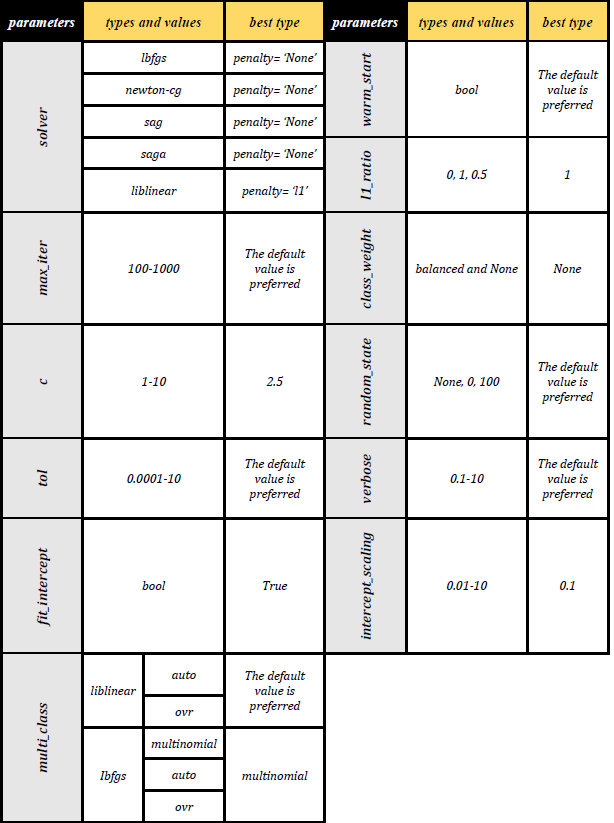

-------

<a id="4"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">4 <span style='color:#CDA63A'>|</span> Model Building </div>

**In the end**, we make several models according to the above summary and compare the results with each other: 

<a id="4.1"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">Model 1 <span style='color:#CDA63A'>|</span> Default hyperparameters </div>

In [52]:
logreg = LogisticRegression() # default hyperparameters was seted for modeling
logreg.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logreg.predict(X_test)

print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on train set: 0.77
Accuracy of logistic regression classifier on test set: 0.79


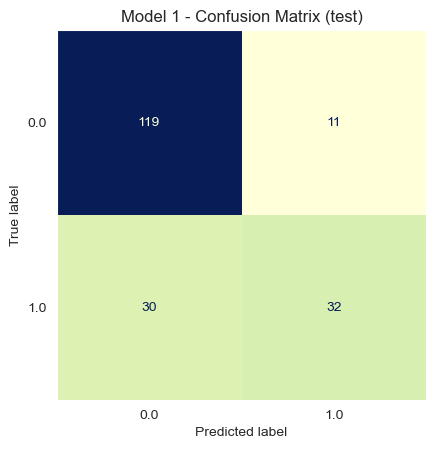

In [53]:
# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(logreg, X_test, y_test, colorbar=False, cmap='YlGnBu')
plt.title('Model 1 - Confusion Matrix (test)')
plt.grid(False) 

In [54]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.80      0.92      0.85       130
         1.0       0.74      0.52      0.61        62

    accuracy                           0.79       192
   macro avg       0.77      0.72      0.73       192
weighted avg       0.78      0.79      0.77       192



In [55]:
# Calculate Performance Metrics
def metrics_calculator(y_test, y_pred, model_name):
    '''
    This function calculates all desired performance metrics for a given model.
    '''
    result = pd.DataFrame(data=[accuracy_score(y_test, y_pred),
                                precision_score(y_test, y_pred, average='macro'),
                                recall_score(y_test, y_pred, average='macro'),
                                f1_score(y_test, y_pred, average='macro')],
                          index=['Accuracy','Precision','Recall','F1-score'],
                          columns = [model_name])
    return result

In [56]:
Model1_result = metrics_calculator(y_test, y_pred, 'Model 1 (Default)')
Model1_result

,Model 1 (Default)
Accuracy,0.786458
Precision,0.771422
Recall,0.715757
F1-score,0.731285


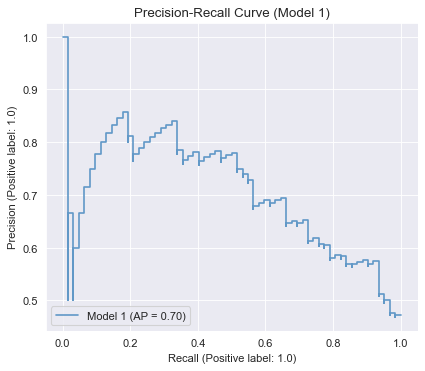

In [57]:
# Precision-Recall Curve (PRC)
sns.set_style('darkgrid')
fig, ax = plt.subplots(figsize=(6, 5), dpi=80)
PrecisionRecallDisplay.from_estimator(logreg, X_test, y_test, ax=ax, name='Model 1', color='#6198c7')
plt.title('Precision-Recall Curve (Model 1)')
plt.show()

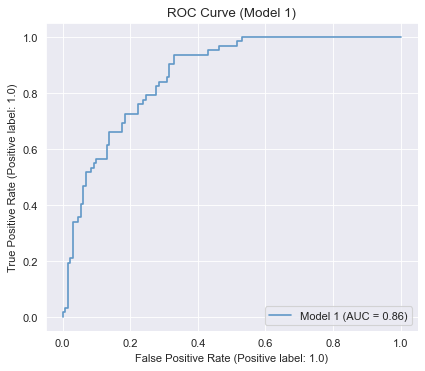

In [58]:
# ROC Curve
fig, ax = plt.subplots(figsize=(6, 5), dpi=80)
RocCurveDisplay.from_estimator(logreg, X_test, y_test, ax=ax, name='Model 1', color='#6198c7')
plt.title('ROC Curve (Model 1)')
plt.show()

<a id="4.2"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">Model 2 <span style='color:#CDA63A'>|</span> Best hyperparameters for “liblinear” </div>

In [59]:
# best parameters for 'liblinear' solver
logreg = LogisticRegression(solver='liblinear', penalty='l1', C=2.5, fit_intercept= True,
                            intercept_scaling= 0.1, class_weight=None)
logreg.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logreg.predict(X_test)

print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on train set: 0.76
Accuracy of logistic regression classifier on test set: 0.79


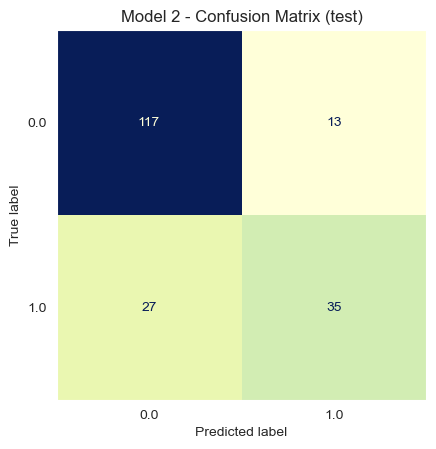

In [60]:
# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(logreg, X_test, y_test, colorbar=False, cmap='YlGnBu')
plt.title('Model 2 - Confusion Matrix (test)')
plt.grid(False) 

In [61]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.81      0.90      0.85       130
         1.0       0.73      0.56      0.64        62

    accuracy                           0.79       192
   macro avg       0.77      0.73      0.75       192
weighted avg       0.79      0.79      0.78       192



In [62]:
Model2_result = metrics_calculator(y_test, y_pred, 'Model 2 (liblinear)')
Model2_result

,Model 2 (liblinear)
Accuracy,0.791667
Precision,0.770833
Recall,0.732258
F1-score,0.745189


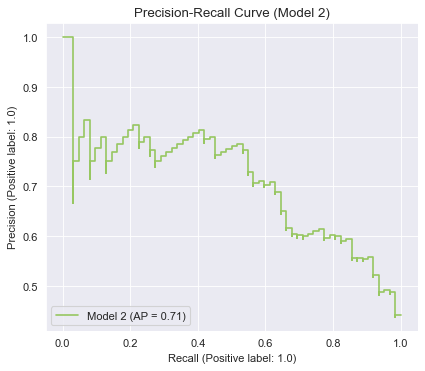

In [63]:
# Precision-Recall Curve (PRC)
fig, ax = plt.subplots(figsize=(6, 5), dpi=80)
PrecisionRecallDisplay.from_estimator(logreg, X_test, y_test, ax=ax, name='Model 2', color='#97c761')
plt.title('Precision-Recall Curve (Model 2)')
plt.show()

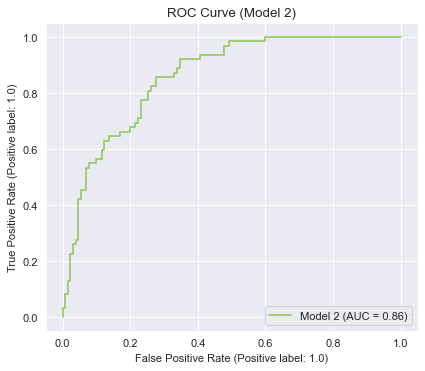

In [64]:
# ROC Curve
fig, ax = plt.subplots(figsize=(6, 5), dpi=80)
RocCurveDisplay.from_estimator(logreg, X_test, y_test, ax=ax, name='Model 2', color='#97c761')
plt.title('ROC Curve (Model 2)')
plt.show()

<a id="4.3"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">Model 3 <span style='color:#CDA63A'>|</span> Best hyperparameters for “lbfgs” </div>

In [65]:
logreg = LogisticRegression(solver='lbfgs', penalty='none', C=2.5, fit_intercept= True,
                            intercept_scaling= 0.1, class_weight=None, multi_class='multinomial') 
logreg.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logreg.predict(X_test)

print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on train set: 0.77
Accuracy of logistic regression classifier on test set: 0.80


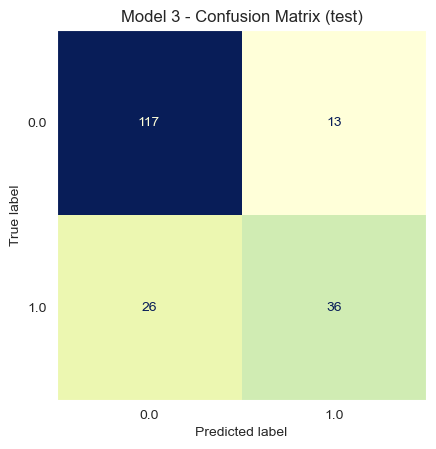

In [66]:
# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(logreg, X_test, y_test, colorbar=False, cmap='YlGnBu')
plt.title('Model 3 - Confusion Matrix (test)')
plt.grid(False) 

In [67]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.82      0.90      0.86       130
         1.0       0.73      0.58      0.65        62

    accuracy                           0.80       192
   macro avg       0.78      0.74      0.75       192
weighted avg       0.79      0.80      0.79       192



In [68]:
Model3_result = metrics_calculator(y_test, y_pred, 'Model 3 (lbfgs)')
Model3_result

,Model 3 (lbfgs)
Accuracy,0.796875
Precision,0.776438
Recall,0.740323
F1-score,0.752896


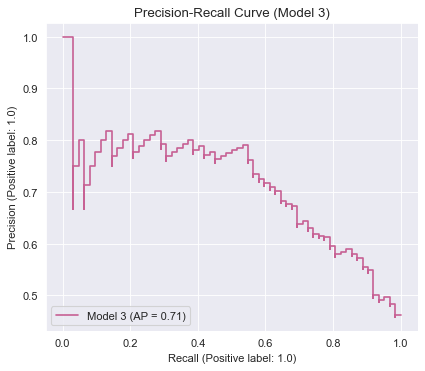

In [69]:
# Precision-Recall Curve (PRC)
fig, ax = plt.subplots(figsize=(6, 5), dpi=80)
PrecisionRecallDisplay.from_estimator(logreg, X_test, y_test, ax=ax, name='Model 3', color='#c76194')
plt.title('Precision-Recall Curve (Model 3)')
plt.show()

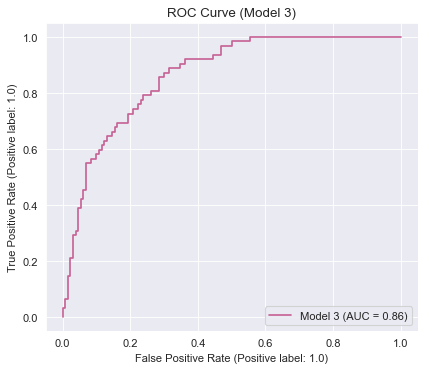

In [70]:
# ROC Curve
fig, ax = plt.subplots(figsize=(6, 5), dpi=80)
RocCurveDisplay.from_estimator(logreg, X_test, y_test, ax=ax, name='Model 3', color='#c76194')
plt.title('ROC Curve (Model 3)')
plt.show()

<a id="4.4"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">Model 4 <span style='color:#CDA63A'>|</span> Best hyperparameters for “newton-cg” </div>

In [71]:
logreg = LogisticRegression(solver='newton-cg', penalty='none', C=2.5, fit_intercept= True,
                            intercept_scaling= 0.1, class_weight=None) 
logreg.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logreg.predict(X_test)

print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on train set: 0.77
Accuracy of logistic regression classifier on test set: 0.80


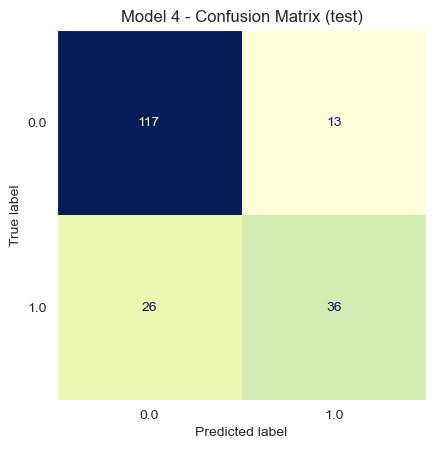

In [72]:
# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(logreg, X_test, y_test, colorbar=False, cmap='YlGnBu')
plt.title('Model 4 - Confusion Matrix (test)')
plt.grid(False) 

In [73]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.82      0.90      0.86       130
         1.0       0.73      0.58      0.65        62

    accuracy                           0.80       192
   macro avg       0.78      0.74      0.75       192
weighted avg       0.79      0.80      0.79       192



In [74]:
Model4_result = metrics_calculator(y_test, y_pred, 'Model 4 (newton-cg)')
Model4_result

,Model 4 (newton-cg)
Accuracy,0.796875
Precision,0.776438
Recall,0.740323
F1-score,0.752896


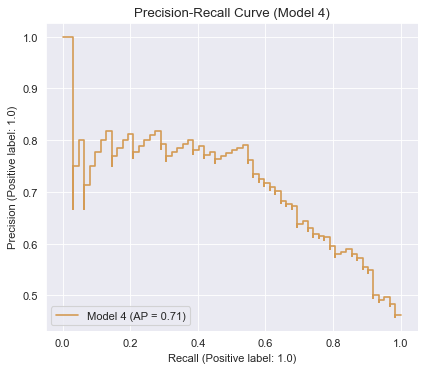

In [75]:
# Precision-Recall Curve (PRC)
fig, ax = plt.subplots(figsize=(6, 5), dpi=80)
PrecisionRecallDisplay.from_estimator(logreg, X_test, y_test, ax=ax, name='Model 4', color='#d49b55')
plt.title('Precision-Recall Curve (Model 4)')
plt.show()

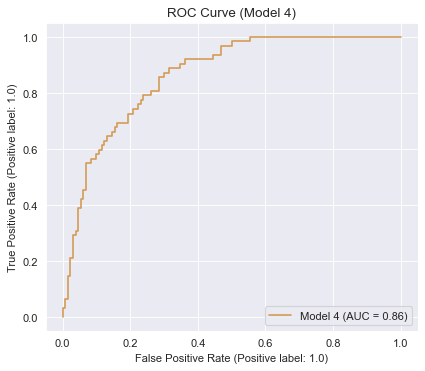

In [76]:
# ROC Curve
fig, ax = plt.subplots(figsize=(6, 5), dpi=80)
RocCurveDisplay.from_estimator(logreg, X_test, y_test, ax=ax, name='Model 4', color='#d49b55')
plt.title('ROC Curve (Model 4)')
plt.show()

<a id="5"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700">5 <span style='color:#CDA63A'>|</span> Conclusion </div>

The **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">Results</mark>** of the **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">Models (1–4)</mark>** are summarized in the following tables:

In [77]:
# Conclusion
print('Conclusion:')
pd.concat([Model1_result, Model2_result, Model3_result, Model4_result], axis=1)

Conclusion:


,Model 1 (Default),Model 2 (liblinear),Model 3 (lbfgs),Model 4 (newton-cg)
Accuracy,0.786458,0.791667,0.796875,0.796875
Precision,0.771422,0.770833,0.776438,0.776438
Recall,0.715757,0.732258,0.740323,0.740323
F1-score,0.731285,0.745189,0.752896,0.752896


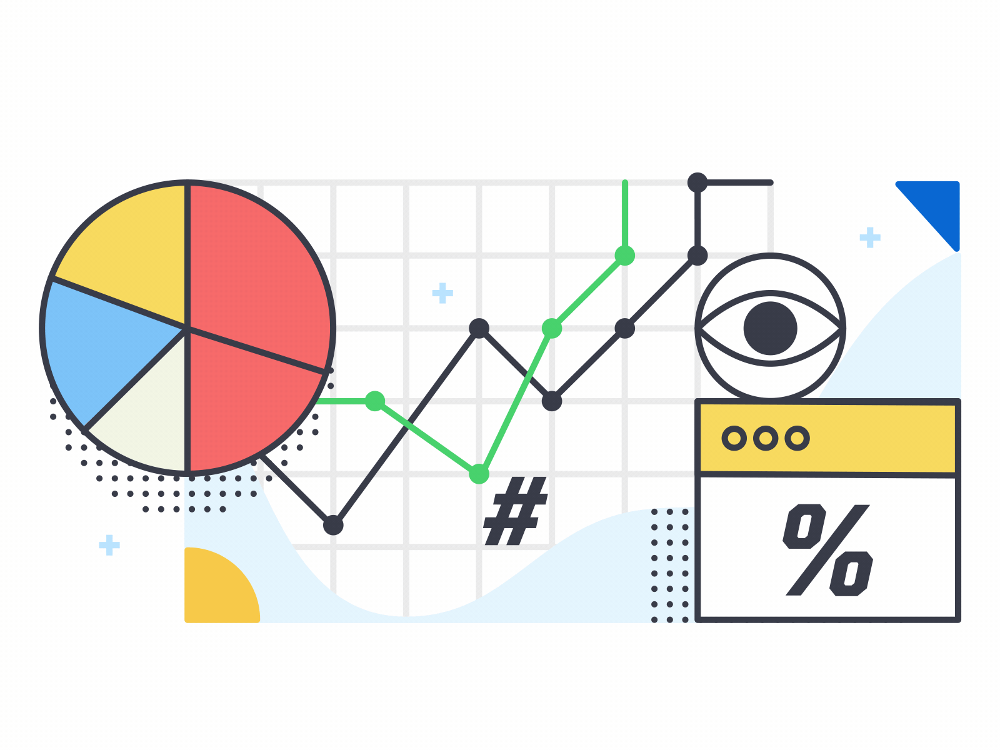

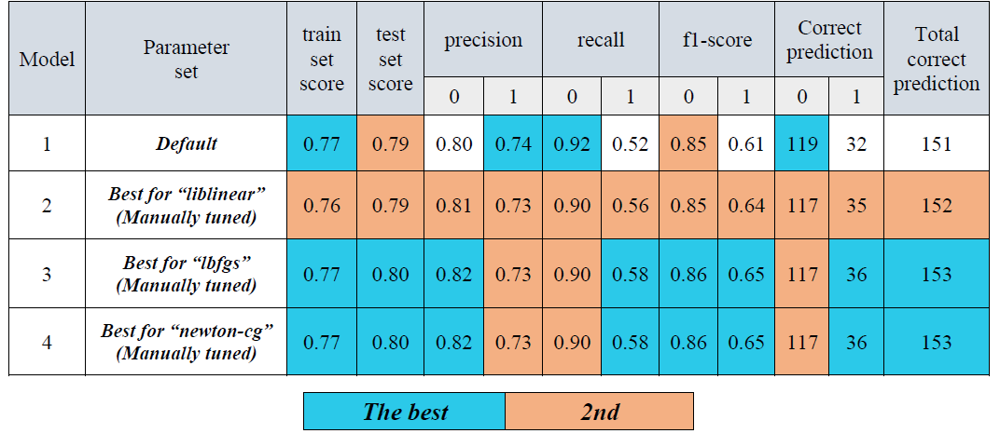

The manually tuned **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">Models 2 through 4</mark>** exhibited **improved performance** in terms of **accuracy, precision, recall,** and **F1 score** on the **test set** in comparison to **<mark style="background-color:#E1B12D;color:white;border-radius:5px;opacity:1.0">Model 1</mark>**, which utilized default hyperparameters. Moreover, the classifiers in **Models 2 to 4** demonstrated **enhanced performance** in predicting **label 1** compared to **Model 1**. This suggests that the classifiers in **Models 2 to 4** were more effective in predicting **total correct labels** than the classifier in **Model 1** with the **default hyperparameters**.

Moreover, as we mentioned earlier in this notebook, manual hyperparameter tuning can be a time-consuming process. However, there are several automated methods available, such as **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">GridSearchCV</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) and **<mark style="background-color:#db6797;color:white;border-radius:5px;opacity:1.0">RandomizedSearchCV</mark>** [[Reference]](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html), which are provided by Scikit-learn.

<a id="6"></a>
<div style="padding:20px;
            color:white;
            margin:10;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:5px;
            background-color:#3b3745;
            overflow:hidden;
            font-weight:700"> <span style='color:#CDA63A'>|</span> References </div>

**[1] https://www.geeksforgeeks.org/understanding-logistic-regression/**

**[2] https://www.spiceworks.com/tech/artificial-intelligence/articles/what-is-logistic-regression/**

**[3] https://www.blog.trainindata.com/hyperparameter-tuning-for-machine-learning/**

**[4] https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html**

**[5] https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html**

**[6] https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html**

<div <h3 style="border-radius:8px;border:#CDA63A solid;padding: 20px;background-color:#fcfafa;font-size:90%;text-align:center">
</h3>
      <h4 class="alert-heading">Thank you for taking the time to consider this matter</h4>
  <hr> 
  <h4><b>Author:</b> Ali Farahmandfar </h4>
  <hr>  
  
<b>📚Read more project ➡️</b> **kaggle: https://www.kaggle.com/alifarahmandfar | GitHub: https://github.com/alifrmf <br>**
<hr>   
    
<h4><strong> If you enjoyed this Notebook, please give it an upvote </strong>
    
<h4><strong> 💫Best Wishes💫 </strong>